## Backgound
GoodBank is a Canadian fin-tech that offers installment loans to its customers exclusively online. GoodBank prides itself in having the most automated account management system amongst all its competitors. As a result, all of GoodBank’s account handling decisions are made automatically; that is, no human ever touches an application from origination onwards. Try as it might, GoodBank does not always extend loans to customers that pay their loans back fully; some customers fall into arrears and some even stop paying their loans altogether. Once a customer stops paying a loan, GoodBank can try and collect. However, collection efforts are expensive (as they are quite human intervention) and often do not work. GoodBank uses models to select and send to collections the customers that are most likely to pay back. 

The decision to send a customer to collections is primarily based on the collections team’s ability to recover all or part of the outstanding balance of the loan. As such, the job of a collections model is to select the customers that are highly likely to make payments after they have been contacted by the collections team. These payments are called recoveries. The model makes this decision based on data provided by the customer at the time of application.

## Task
You recently joined GoodBank’s risk management group as a data scientist. Your job is to re-develop GoodBank’s collections models with an eye towards improving GoodBank’s collection efforts on charged off accounts. You are told that you can use any model. You are to make a recommendation during a 45 minute (30 for the preso, 15 for questions) presentation to the risk management committee. Feel free to make any assumptions needed to complete the case.

The data can be downloaded at: https://www.kaggle.com/wordsforthewise/lending-club?select=accepted_2007_to_2018Q4.csv.gz
A data dictionary is included with this writeup.
Please note that in late 2013, GoodBank changed their credit score vendor from Experian to FICO.


### Import necessary libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score
import scipy.stats as stats
from sklearn import metrics
from sklearn import tree
from sklearn.metrics import roc_auc_score

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler

# to compute distances
from scipy.spatial.distance import cdist, pdist

# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

In [3]:
df_accepted0 = pd.read_csv("accepted_2007_to_2018Q4.csv")
df_rejected = pd.read_csv("rejected_2007_to_2018Q4.csv")
df_LCDD = pd.read_excel("LCDataDictionary.xlsx", sheet_name='ReqdCols')

In [4]:
accepted_cols = df_accepted0.columns.to_list()
rejected_cols = df_rejected.columns.to_list()
[column for column in accepted_cols if column in rejected_cols]

[]

#### There is no similarity in the columns. This is possible that both datasets are representing different stages. We can assume that rejected dataset (df_rejected) includes all the rejected customers at the first stage while the ones who cleared the first stage has been chosen for the second stage. Since we are focused on the collection of loan from the customers who were paying the loans, we do not need those ones with rejected loan applications.

#### Our analysis will be focused on df_accepted.

In [5]:
df_accepted=pd.DataFrame()

In [6]:
# copy of df_accepted
df_accepted = df_accepted0.copy();

#### Since the credit score vendor was changed from Experian to FICO in late 2013, and there is no equivalency between the Experian and FICO, we can use dataset with the credit score values obtained from FICO. For this, we use the loan issue date that is given in the original dataset once the application is accepted.

In [7]:
df_accepted = df_accepted[pd.to_datetime(df_accepted.issue_d)>='2014-01-01']

#### Since we used only the data that is provided by the customer at the time of application, we will use only those fields that are in the borwsenotes (Borrower's Notes)

In [8]:
LCDD_cols = df_LCDD.columns.to_list()
LCDD_accepted_cols = [column for column in accepted_cols if column in LCDD_cols]
len(LCDD_accepted_cols)

58

#### We have 58 matching columns. There might be other columns whose names are different. We need to go over them one by one manually.

In [9]:
LCDD_mismatch_accepted_cols = [column for column in accepted_cols if column not in LCDD_cols]
LCDD_mismatch_LCDD_cols = [column for column in LCDD_cols if column not in accepted_cols]

In [10]:
print(LCDD_mismatch_accepted_cols)
print('*'*100)
print(LCDD_mismatch_LCDD_cols)

['member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'int_rate', 'sub_grade', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'addr_state', 'delinq_2yrs', 'earliest_cr_line', 'fico_range_low', 'fico_range_high', 'inq_last_6mths', 'mths_since_last_delinq', 'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'initial_list_status', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d', 'last_fico_range_high', 'last_fico_range_low', 'policy_code', 'verification_status_joint', 'acc_now_delinq', 'total_rev_hi_lim', 'acc_open_past_24mths', 'bc_open_to_buy', 'bc_util', 'delinq_amnt', 'mo_sin_old_il_acct', 'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq', 'mths_since_recent_inq', 'mths_since_recent_

#### We can see that most of them have spaces, _ and capital and small letter cases issues. Lets remove them and check again.

In [11]:
#Removing extra spaces
accepted_cols = df_accepted.columns.str.replace(' ','')
LCDD_cols = df_LCDD.columns.str.replace(' ','')

In [12]:
LCDD_accepted_cols = [column for column in accepted_cols if column in LCDD_cols]
len(LCDD_accepted_cols)

70

In [13]:
# Updating column names without spaces
df_accepted.columns = df_accepted.columns.str.replace(' ','')
df_LCDD.columns = df_LCDD.columns.str.replace(' ','')

In [14]:
#Removing extra underscores (not from the LCDD dataframe)
accepted_cols_nounderscore = df_accepted.columns.str.replace('_','')
LCDD_cols_nounderscore = LCDD_cols.str.replace('_','')

In [15]:
LCDD_cols_nounderscore_lower = [column for column in LCDD_cols_nounderscore if column.lower() in accepted_cols_nounderscore]
len(LCDD_cols_nounderscore_lower)

103

In [16]:
# Updating column names without spaces
df_accepted.columns = df_accepted.columns.str.replace('_','').str.lower()
df_LCDD.columns = df_LCDD.columns.str.replace('_','').str.lower()

In [17]:
cols_selected = [column for column in df_LCDD.columns if column.lower() in df_accepted.columns]
len(cols_selected)

103

In [18]:
# Updating data from df_accepted to df_LCDD 
df_LCDD[cols_selected] = df_accepted[cols_selected]

#### 103 columns are matched. We can check rest of the columns manually to see if there is any interesting column.

In [19]:
LCDD_mismatch_LCDD_cols = [column.lower() for column in df_LCDD.columns if column.lower() not in df_accepted.columns]
LCDD_mismatch_accepted_cols = [column.lower() for column in df_accepted.columns if column.lower() not in df_LCDD.columns]
print(LCDD_mismatch_LCDD_cols)
print('*'*100)
print(LCDD_mismatch_accepted_cols)

['browsenotesfile', 'acceptd', 'creditpulld', 'effectiveintrate', 'expd', 'expdefaultrate', 'ilsexpd', 'isincv', 'listd', 'msa', 'mthssinceoldestilopen', 'mthssincemostrecentinq', 'mthssincerecentloandelinq', 'reviewstatus', 'reviewstatusd', 'servicefeerate', 'totalrevhilim\xa0', 'verifiedstatusjoint']
****************************************************************************************************
['fundedamntinv', 'verificationstatus', 'issued', 'loanstatus', 'pymntplan', 'outprncp', 'outprncpinv', 'totalpymnt', 'totalpymntinv', 'totalrecprncp', 'totalrecint', 'totalreclatefee', 'recoveries', 'collectionrecoveryfee', 'lastpymntd', 'lastpymntamnt', 'nextpymntd', 'lastcreditpulld', 'lastficorangehigh', 'lastficorangelow', 'policycode', 'verificationstatusjoint', 'totalrevhilim', 'mosinoldilacct', 'mthssincerecentbcdlq', 'mthssincerecentinq', 'hardshipflag', 'hardshiptype', 'hardshipreason', 'hardshipstatus', 'deferralterm', 'hardshipamount', 'hardshipstartdate', 'hardshipenddate', '

#### There only one column name is mismatched that can be added to our analysis, namely 'verifiedstatusjoint'. Rest are not giving any useful insight or they are not found in the accepted dataset.

In [20]:
df_LCDD.rename(columns={'totalrevhilim\xa0':'totalrevhilim'}, inplace=True)

In [21]:
df_LCDD['verifiedstatusjoint'] = df_accepted['verificationstatusjoint']

In [22]:
df = df_LCDD.copy() #keeping the copy of original data

In [23]:
# Verifying if there is any duplicate column name
any(df.columns.to_list().count(x) > 1 for x in df.columns.to_list())

False

In [24]:
np.random.seed(2) # to get the same random results every time
df.sample(10)

,browsenotesfile,acceptd,accnowdelinq,accopenpast24mths,addrstate,allutil,annualincjoint,annualinc,applicationtype,avgcurbal,bcopentobuy,bcutil,chargeoffwithin12mths,collections12mthsexmed,creditpulld,delinq2yrs,delinqamnt,desc,dti,dtijoint,earliestcrline,effectiveintrate,emptitle,emplength,expd,expdefaultrate,ficorangehigh,ficorangelow,fundedamnt,grade,homeownership,id,ilutil,ilsexpd,initialliststatus,inqfi,inqlast12m,inqlast6mths,installment,intrate,isincv,listd,loanamnt,maxbalbc,memberid,mosinoldrevtlop,mosinrcntrevtlop,mosinrcnttl,mortacc,msa,mthssincelastmajorderog,mthssinceoldestilopen,mthssincercntil,mthssincelastdelinq,mthssincelastrecord,mthssincemostrecentinq,mthssincerecentbc,mthssincerecentloandelinq,mthssincerecentrevoldelinq,numacctsever120pd,numactvbctl,numactvrevtl,numbcsats,numbctl,numiltl,numoprevtl,numrevaccts,numrevtlbalgt0,numsats,numtl120dpd2m,numtl30dpd,numtl90gdpd24m,numtloppast12m,openacc6m,openil12m,openil24m,openactil,openrv12m,openrv24m,openacc,pcttlnvrdlq,percentbcgt75,pubrecbankruptcies,pubrec,purpose,reviewstatus,reviewstatusd,revolbal,revolutil,servicefeerate,subgrade,taxliens,term,title,totcollamt,totcurbal,tothicredlim,totalbalil,totalcutl,totalilhighcreditlimit,totalrevhilim,totalacc,totalbalexmort,totalbclimit,url,verifiedstatusjoint,zipcode,revolbaljoint,secappficorangelow,secappficorangehigh,secappearliestcrline,secappinqlast6mths,secappmortacc,secappopenacc,secapprevolutil,secappopenactil,secappnumrevaccts,secappchargeoffwithin12mths,secappcollections12mthsexmed,secappmthssincelastmajorderog,disbursementmethod
2092975,NaN,NaN,0.0,0.0,WV,48.0,NaN,100000.0,Individual,8843.0,59348.0,44.2,0.0,0.0,NaN,0.0,0.0,NaN,14.34,NaN,Feb-1987,NaN,Civil Engineer,7 years,NaN,NaN,749.0,745.0,40000.0,A,MORTGAGE,124724678,70.0,NaN,w,0.0,0.0,0.0,1204.60,5.32,NaN,NaN,40000.0,15575.0,NaN,369.0,39.0,32.0,5.0,NaN,NaN,NaN,32.0,NaN,NaN,NaN,39.0,NaN,NaN,0.0,6.0,9.0,11.0,13.0,6.0,17.0,24.0,9.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,20.0,100.0,27.3,0.0,0.0,debt_consolidation,NaN,NaN,62304.0,45.7,NaN,A1,0.0,36 months,Debt consolidation,0.0,176866.0,286861.0,10530.0,1.0,15000.0,NaN,35.0,72834.0,106400.0,https://lendingclub.com/browse/loanDetail.acti...,NaN,258xx,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cash
1275008,NaN,NaN,0.0,1.0,MD,NaN,NaN,43000.0,Individual,44993.0,211.0,98.1,0.0,0.0,NaN,0.0,0.0,NaN,15.77,NaN,Jul-1985,NaN,associate,10+ years,NaN,NaN,714.0,710.0,6075.0,D,OWN,16311343,NaN,NaN,w,NaN,NaN,0.0,155.06,18.24,NaN,NaN,6075.0,NaN,NaN,346.0,145.0,16.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,145.0,NaN,NaN,0.0,2.0,3.0,2.0,3.0,1.0,3.0,4.0,3.0,5.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,5.0,100.0,100.0,0.0,0.0,credit_card,NaN,NaN,26775.0,99.2,NaN,D5,0.0,60 months,Credit card refinancing,0.0,224967.0,232000.0,NaN,NaN,0.0,NaN,11.0,26775.0,11000.0,https://lendingclub.com/browse/loanDetail.acti...,NaN,210xx,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cash
1722589,NaN,NaN,0.0,7.0,OK,54.0,NaN,66700.0,Individual,21059.0,1151.0,75.5,0.0,0.0,NaN,0.0,0.0,NaN,10.33,NaN,Oct-1994,NaN,Daycare Director/Teacher retired,10+ years,NaN,NaN,674.0,670.0,15000.0,C,MORTGAGE,96730342,63.0,NaN,w,1.0,4.0,2.0,512.60,13.99,NaN,NaN,15000.0,2291.0,NaN,267.0,0.0,0.0,4.0,NaN,NaN,NaN,15.0,76.0,77.0,NaN,20.0,NaN,76.0,0.0,2.0,6.0,2.0,6.0,4.0,9.0,16.0,6.0,10.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,5.0,11.0,95.2,50.0,1.0,1.0,home_improvement,NaN,NaN,6231.0,47.6,NaN,C3,0.0,36 months,Home improvement,0.0,189531.0,209675.0,6334.0,0.0,10075.0,NaN,24.0,12565.0,4700.0,https://lendingclub.com/browse/loanDetail.acti...,NaN,730xx,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cash
1166904,NaN,NaN,0.0,3.0,MS,NaN,NaN,65000.0,Individual,10558.0,31026.0,96.5,0.0,0.0,NaN,0.0,0.0,NaN,39.66,NaN,Mar-1974,NaN,Guidance Counselor,10+ years,NaN,NaN,684.0,680.0,8000.0,C,MORTGAGE,30906001,NaN,NaN,f,NaN,NaN,2.0,273.35,13.98,NaN,NaN,8000.0,NaN,NaN,487.0,5.0,3.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53.0,NaN,NaN,0.0,8.0,16.0,8.0,13.0,6.0,18.0,25.0,16.0,21.0,0.0,0.0

In [25]:
df.shape

(2029952, 121)

#### There are 2 million rows and 121 columns. Next we look at the null values.

In [26]:
df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2029952 entries, 0 to 2260698
Data columns (total 121 columns):
 #    Column                         Non-Null Count    Dtype  
---   ------                         --------------    -----  
 0    browsenotesfile                0 non-null        object 
 1    acceptd                        0 non-null        object 
 2    accnowdelinq                   2029952 non-null  float64
 3    accopenpast24mths              2029952 non-null  float64
 4    addrstate                      2029952 non-null  object 
 5    allutil                        1394320 non-null  float64
 6    annualincjoint                 120710 non-null   float64
 7    annualinc                      2029952 non-null  float64
 8    applicationtype                2029952 non-null  object 
 9    avgcurbal                      2029888 non-null  float64
 10   bcopentobuy                    2006577 non-null  float64
 11   bcutil                         2005528 non-null  float64
 12 

#### There are many columns with extreme number of null values. Let's check percentage of data with null values.
#### There are few columns with datatype object. We need to convert their appropriate datatype.

In [27]:
df_missing_values_percentage = ((df.isnull().sum())*100/len(df)).sort_values(ascending=True)

In [28]:
df_missing_values_percentage

numactvbctl                        0.000000
numtl30dpd                         0.000000
numsats                            0.000000
numrevtlbalgt0                     0.000000
numoprevtl                         0.000000
numiltl                            0.000000
numbctl                            0.000000
numtl90gdpd24m                     0.000000
numbcsats                          0.000000
numacctsever120pd                  0.000000
mortacc                            0.000000
mosinrcnttl                        0.000000
mosinrcntrevtlop                   0.000000
mosinoldrevtlop                    0.000000
loanamnt                           0.000000
numactvrevtl                       0.000000
intrate                            0.000000
numtloppast12m                     0.000000
pubrecbankruptcies                 0.000000
url                                0.000000
totalbclimit                       0.000000
totalbalexmort                     0.000000
totalacc                        

In [29]:
len(df_missing_values_percentage[df_missing_values_percentage>35])

40

#### There are 40 columns with missing data more than 35%. 
#### There are 18 columns with 100% null, so we can drop them. Also url column is unnecessary. this can be dropped as well.
#### We will further investigate other columns in EDA to verify if there is any important information (patterns) in these columns or not.

In [30]:
df.drop(['url'], axis=1, inplace=True)
df.drop(df_missing_values_percentage[df_missing_values_percentage==100].index.to_list(),axis=1,inplace=True)
df.shape

(2029952, 102)

In [31]:
df.duplicated(subset=None, keep='first').sum()

0

#### There are no duplicate rows

### Processing Columns

#### 1. "zipcode":

In [32]:
df.zipcode.unique()[0:10]

array(['190xx', '577xx', '605xx', '076xx', '174xx', '300xx', '550xx',
       '293xx', '160xx', '029xx'], dtype=object)

In [33]:
df['zipcode_val']=df.zipcode.str.replace('xx','')

In [34]:
df.zipcode_val[0:10]

0    190
1    577
2    605
3    076
4    174
5    300
6    550
7    293
8    160
9    029
Name: zipcode_val, dtype: object

### Fixing the data types

#### There are columns with object-type datatypes. We convert it to category.

In [35]:
cols_obj = df.select_dtypes(['object'])
cols_obj.columns

Index(['addrstate', 'applicationtype', 'desc', 'earliestcrline', 'emptitle',
       'emplength', 'grade', 'homeownership', 'id', 'initialliststatus',
       'purpose', 'subgrade', 'term', 'title', 'verifiedstatusjoint',
       'zipcode', 'secappearliestcrline', 'disbursementmethod', 'zipcode_val'],
      dtype='object')

In [36]:
for col in cols_obj.columns:
    df[col] = df[col].astype('category')

In [37]:
df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2029952 entries, 0 to 2260698
Data columns (total 103 columns):
 #    Column                         Non-Null Count    Dtype   
---   ------                         --------------    -----   
 0    accnowdelinq                   2029952 non-null  float64 
 1    accopenpast24mths              2029952 non-null  float64 
 2    addrstate                      2029952 non-null  category
 3    allutil                        1394320 non-null  float64 
 4    annualincjoint                 120710 non-null   float64 
 5    annualinc                      2029952 non-null  float64 
 6    applicationtype                2029952 non-null  category
 7    avgcurbal                      2029888 non-null  float64 
 8    bcopentobuy                    2006577 non-null  float64 
 9    bcutil                         2005528 non-null  float64 
 10   chargeoffwithin12mths          2029952 non-null  float64 
 11   collections12mthsexmed         2029952 non-null 

#### We can see that the memory usage is reduced from 2.5+ GB to 1.4 GB.

### Categorical Data Description

In [38]:
df.describe(include='category').T

,count,unique,top,freq
addrstate,2029952,51,CA,276361
applicationtype,2029952,2,Individual,1909242
desc,15347,14893,,23
earliestcrline,2029952,743,Sep-2004,14409
emptitle,1877346,386942,Teacher,37991
emplength,1892044,11,10+ years,677437
grade,2029952,7,C,591304
homeownership,2029952,5,MORTGAGE,995479
id,2029952,2029952,55716,1
initialliststatus,2029952,2,w,1495650


#### id is unique and therefore can be deleted.
#### desc has so many null values and rest are text values. It can also be deleted.
####  zipcode can be deleted as this is replaced by zipcode_val.
#### There are other columns that need data preprocessing that will be done later with EDA.

In [39]:
df.drop(['id','desc','zipcode'],axis=1,inplace=True)

In [40]:
cols_cat= df.select_dtypes(['category']).columns

#### There are two timestamp columns. We need to convert them to timestamp

In [41]:
df.earliestcrline = pd.to_datetime(df.earliestcrline)
df.secappearliestcrline = pd.to_datetime(df.secappearliestcrline)

In [42]:
for col in cols_cat:
    print('Percent unique values in',col,'are :')
    print(df[col].value_counts()*100/len(df))
    print('*'*50)

Percent unique values in addrstate are :
CA    13.614164
TX     8.318522
NY     8.180834
FL     7.194210
IL     4.048766
NJ     3.642057
PA     3.396238
OH     3.345153
GA     3.291654
NC     2.782627
VA     2.743661
MI     2.631836
MD     2.393948
AZ     2.392766
MA     2.263255
CO     2.136652
WA     2.052265
MN     1.755460
IN     1.733736
TN     1.645605
MO     1.594274
CT     1.579495
NV     1.446389
WI     1.333332
SC     1.250768
AL     1.205004
OR     1.170028
LA     1.134510
KY     0.976772
OK     0.920761
KS     0.838493
AR     0.758245
UT     0.651887
MS     0.621197
NM     0.530210
NH     0.495825
HI     0.461932
RI     0.443212
NE     0.384492
WV     0.357151
DE     0.288036
MT     0.277494
ME     0.244883
AK     0.225523
VT     0.225326
DC     0.224931
ID     0.211680
WY     0.207049
SD     0.200744
ND     0.176901
IA     0.000049
Name: addrstate, dtype: float64
**************************************************
Percent unique values in applicationtype are :
Individual   

#### addrstate and zipcode are providing same information. We can addrstate and keep working with 3 digit zip code.
#### there are two application types. Mostly are individuals. We will analyze them further in EDA separately.
#### emptitles is very diverse. We delete this feature.
#### grade and subgrades are providing same information. we can choose subgrades and delete grades
#### homeownership can reduce number of categories. we will work on it in feature engineering
#### purpose and title are giving same information but purpose is very clearly defined. We can look into it in EDA and delete title.
#### Around 96.5% customers receives loan in cash and 3.5% are direct_pay
#### 71% are 36 month term in comparison to 29% are 60 month term.
#### 33% of the customers have 10+ years of employment which seems to be an outlier. 8.5% have employment less than 1 year.

In [43]:
df.drop(['addrstate','subgrade','title','emptitle'],axis=1,inplace=True)

In [44]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
accnowdelinq,2029952.0,0.004366,0.071264,0.00,0.0000,0.00,0.00,1.400000e+01
accopenpast24mths,2029952.0,4.574361,3.200183,0.00,2.0000,4.00,6.00,6.400000e+01
allutil,1394320.0,57.032295,20.904748,0.00,43.0000,58.00,72.00,2.390000e+02
annualincjoint,120710.0,123624.636701,74161.346328,5693.51,83400.0000,110000.00,147995.00,7.874821e+06
annualinc,2029952.0,78711.860149,117488.724924,0.00,46800.0000,65000.00,95000.00,1.100000e+08
avgcurbal,2029888.0,13528.172244,16481.118868,0.00,3085.0000,7306.00,18708.00,7.529940e+05
bcopentobuy,2006577.0,11673.860124,16843.195491,0.00,1809.0000,5651.00,14596.00,7.111400e+05
bcutil,2005528.0,57.102564,28.658836,0.00,34.4000,59.00,82.40,3.182000e+02
chargeoffwithin12mths,2029952.0,0.008938,0.107757,0.00,0.0000,0.00,0.00,1.000000e+01
collections12mthsexmed,2029952.0,0.019913,0.158027,0.00,0.0000,0.00,0.00,2.000000e+01


#### There are feature for individual primary borrower's income and for joint income. We can further look at them in feature engineering and see the possibility of reducing the features
#### It looks like many columns have outliers and many have large number of null values. We use imputer function to impute the nan values in the dataset.
#### Secondly, several of the floating type columns can be replaced with int type data.

### FEATURE ENGINEERING

### Two steps to follow: feature engineering and imputation.
#### feature require engineering
* 'homeownership': home ownership status provided by the borrower during registration. Values must be RENT, OWN, MORTGAGE, OTHER

In [45]:
df.homeownership.unique()

['MORTGAGE', 'RENT', 'OWN', 'ANY', 'NONE']
Categories (5, object): ['MORTGAGE', 'RENT', 'OWN', 'ANY', 'NONE']

In [46]:
df.homeownership=df.homeownership.str.replace('NONE','OTHER').str.replace('ANY','OTHER')
df.homeownership.unique()

array(['MORTGAGE', 'RENT', 'OWN', 'OTHER'], dtype=object)

In [47]:
df.homeownership=df.homeownership.astype('category')

* 'ficorangelow' and 'ficorangehigh'
#### Check if we can write one categorical variable for it.

In [48]:
max(df.ficorangehigh-df.ficorangelow),min(df.ficorangehigh),min(df.ficorangelow),max(df.ficorangehigh),max(df.ficorangelow)

(5.0, 664.0, 660.0, 850.0, 845.0)

#### Since the difference is really small and all lies in the range from 600 to 850, we can make bins based on the standard fico score categories : Fair: below 670 (bin=0), Good: 670 - 739 (bin =1), Very Good: 740 - 799 (bin =2), Exceptional: 800 - 850 (bin = 3)

In [49]:
df['ficorange_mid']=(df.ficorangehigh + df.ficorangelow)/2

In [50]:
 df['ficorange']=pd.cut(x=df['ficorange_mid'], bins=[300, 579, 669, 739, 799, 850],labels=[0,1,2,3,4])

In [51]:
df.ficorange = df['ficorange'].astype('float')

In [52]:
df[['ficorange','ficorange_mid']].head()

,ficorange,ficorange_mid
0,2.0,677.0
1,2.0,717.0
2,2.0,697.0
3,3.0,787.0
4,2.0,697.0


In [53]:
df.drop(['ficorange_mid','ficorangehigh','ficorangelow'],axis=1,inplace=True)

#### Lets check the features for secondary applicant and remove the ones that are not needed

* 'secappficorangehigh' and 'secappficorangelow'

In [54]:
max(df['secappficorangehigh'].dropna()-df['secappficorangelow'].dropna()),min(df.secappficorangehigh.dropna()),min(df.secappficorangelow.dropna()),max(df.secappficorangehigh.dropna()),max(df.secappficorangelow.dropna())

(5.0, 544.0, 540.0, 850.0, 845.0)

In [55]:
df['secappficorange_mid']=(df.secappficorangehigh + df.secappficorangelow)/2

In [56]:
 df['secappficorange']=pd.cut(x=df['secappficorange_mid'], bins=[300,579, 669, 739, 799, 850],labels=[0,1,2,3,4])

In [57]:
df.secappficorange = df['secappficorange'].astype('float')

In [58]:
df.drop(['secappficorange_mid','secappficorangehigh','secappficorangelow'],axis=1,inplace=True)

In [59]:
# secondary applicant information is in df.columns[78:90]
for col in df.columns[78:90]:
    print(f'{col}: {df[col].unique()}')

verifiedstatusjoint: [NaN, 'Not Verified', 'Verified', 'Source Verified']
Categories (3, object): ['Not Verified', 'Verified', 'Source Verified']
revolbaljoint: [    nan   7101.  22716. ... 119403.  60636.  55616.]
secappearliestcrline: [NaT, 2005-02-01, 1987-10-01, 2013-02-01, 2003-03-01, ..., 1964-09-01, 1967-09-01, 1971-07-01, 1959-06-01, 1963-09-01]
Length: 664
Categories (663, datetime64[ns]): [2005-02-01, 1987-10-01, 2013-02-01, 2003-03-01, ..., 1967-09-01, 1971-07-01, 1959-06-01, 1963-09-01]
secappinqlast6mths: [nan  3.  0.  2.  1.  5.  4.  6.]
secappmortacc: [nan  1.  0.  2.  3.  4.  7.  5.  6. 14.  8.  9. 10. 13. 11. 17. 12. 16.
 15. 20. 27. 23. 22. 18.]
secappopenacc: [nan 14.  8. 10.  6. 17.  3.  9. 13.  7. 27.  4. 20. 12.  5. 18. 11. 19.
 16. 30. 38.  1. 23. 29.  2. 28. 15. 39. 40. 25. 24. 21. 22. 26. 32. 42.
  0. 31. 33. 34. 41. 49. 35. 44. 36. 48. 37. 53. 45. 47. 43. 61. 66. 56.
 52. 46. 58. 59. 73. 50. 51. 55. 60. 57. 67. 54. 65. 82.]
secapprevolutil: [  nan  80.   44.1 

#### Since there are large amount of missing values, we can perform imputation after the EDA

### EXPLORATORY DATA ANALYSIS

#### UNIVARIATE ANALYSIS

In [60]:
# We start with float data.
df.describe(include='float').T

,count,mean,std,min,25%,50%,75%,max
accnowdelinq,2029952.0,0.004366,0.071264,0.00,0.0000,0.00,0.00,1.400000e+01
accopenpast24mths,2029952.0,4.574361,3.200183,0.00,2.0000,4.00,6.00,6.400000e+01
allutil,1394320.0,57.032295,20.904748,0.00,43.0000,58.00,72.00,2.390000e+02
annualincjoint,120710.0,123624.636701,74161.346328,5693.51,83400.0000,110000.00,147995.00,7.874821e+06
annualinc,2029952.0,78711.860149,117488.724924,0.00,46800.0000,65000.00,95000.00,1.100000e+08
avgcurbal,2029888.0,13528.172244,16481.118868,0.00,3085.0000,7306.00,18708.00,7.529940e+05
bcopentobuy,2006577.0,11673.860124,16843.195491,0.00,1809.0000,5651.00,14596.00,7.111400e+05
bcutil,2005528.0,57.102564,28.658836,0.00,34.4000,59.00,82.40,3.182000e+02
chargeoffwithin12mths,2029952.0,0.008938,0.107757,0.00,0.0000,0.00,0.00,1.000000e+01
collections12mthsexmed,2029952.0,0.019913,0.158027,0.00,0.0000,0.00,0.00,2.000000e+01


In [61]:
def histogram_boxplot(data, feature, figsize=(12, 3), kde=False, bins=500):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [62]:
cols_flt = df.select_dtypes(['float'])
len(cols_flt.columns)

82

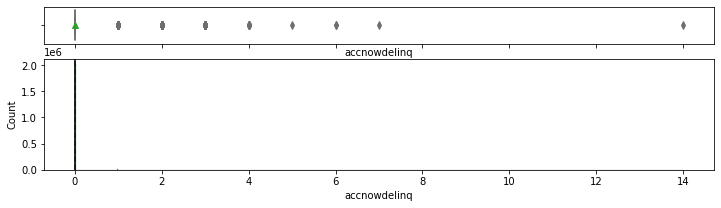

In [63]:
histogram_boxplot(df, cols_flt.columns[0])

#### Most of the customers are lying at 0 which is normal because there are very few people exist in real with delinquent account.

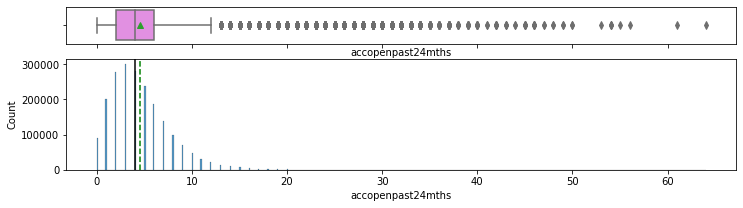

In [64]:
histogram_boxplot(df, cols_flt.columns[1])

#### This is making a normal distribution with right-skewed. On average the account opened in last 24 months are 4 with 3*IQR=[0,12].

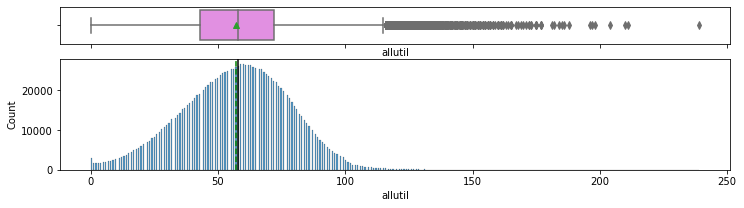

In [65]:
histogram_boxplot(df, cols_flt.columns[2])

#### This is again giving a normal distribution with outliers lying after balance or credit limit exceeding 120.

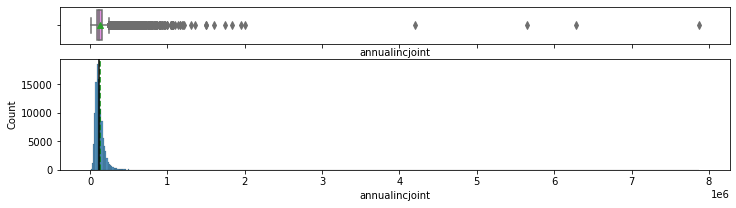

In [66]:
histogram_boxplot(df, cols_flt.columns[3])

#### Annual joint income is close to 6 digits, skewed to the right.

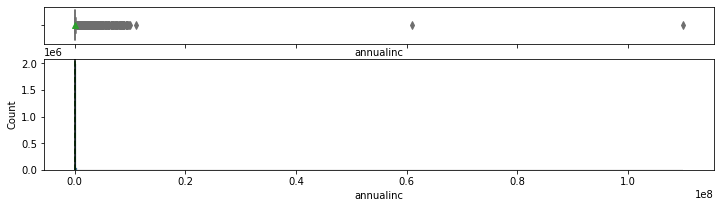

In [67]:
histogram_boxplot(df, cols_flt.columns[4])

#### We can choose annual joint income and delete single income to reduce the number of variable.

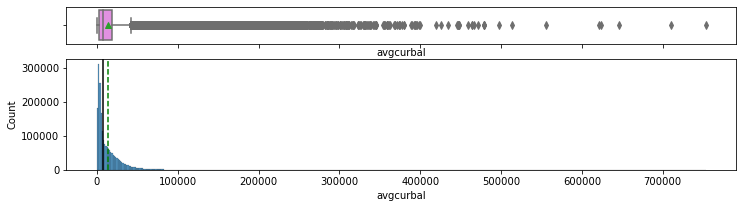

In [68]:
histogram_boxplot(df, cols_flt.columns[5])

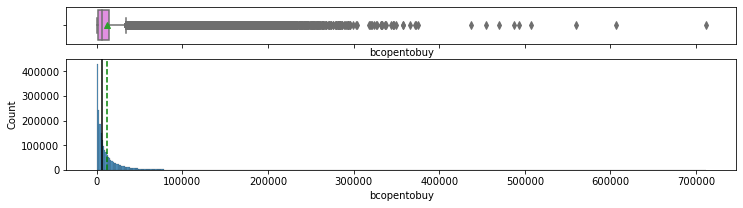

In [69]:
histogram_boxplot(df, cols_flt.columns[6])

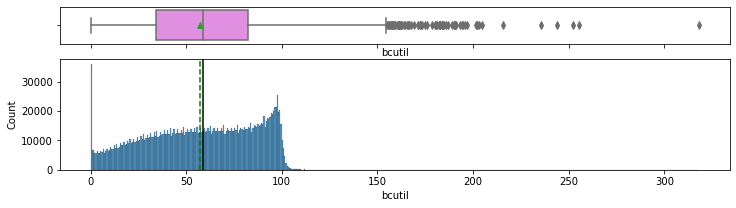

In [70]:
histogram_boxplot(df, cols_flt.columns[7])

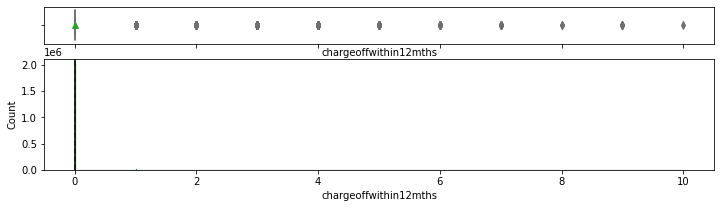

In [71]:
histogram_boxplot(df, cols_flt.columns[8])

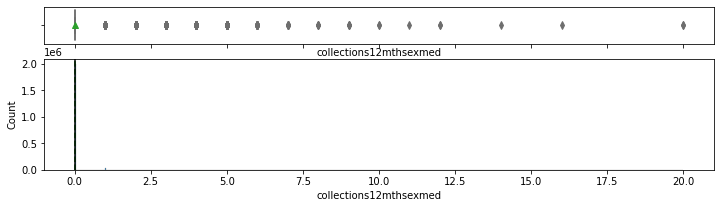

In [72]:
histogram_boxplot(df, cols_flt.columns[9])

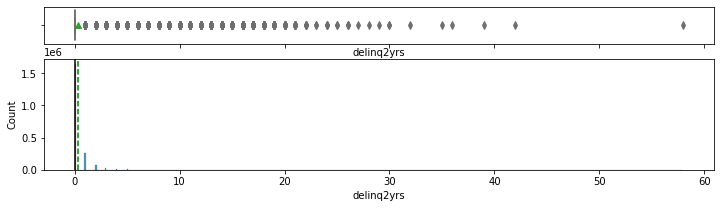

In [73]:
histogram_boxplot(df, cols_flt.columns[10])

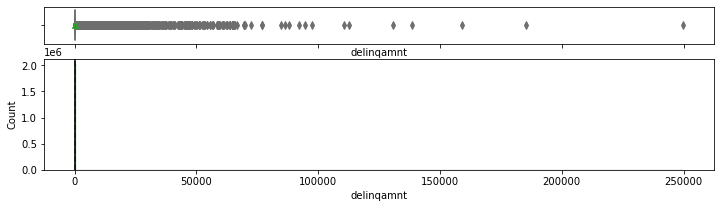

In [74]:
histogram_boxplot(df, cols_flt.columns[11])

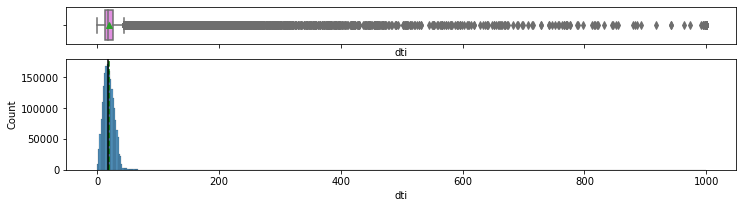

In [75]:
histogram_boxplot(df, cols_flt.columns[12])

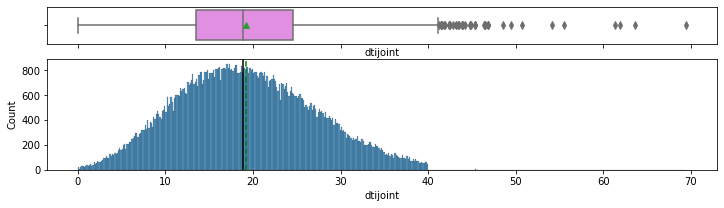

In [76]:
histogram_boxplot(df, cols_flt.columns[13])

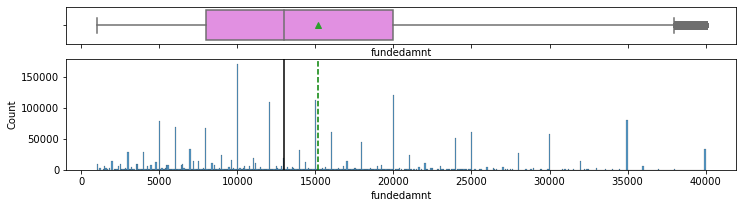

In [77]:
histogram_boxplot(df, cols_flt.columns[14])

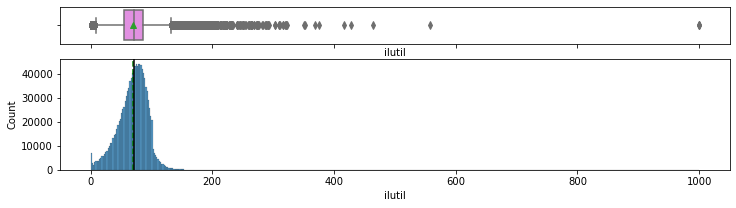

In [78]:
histogram_boxplot(df, cols_flt.columns[15])

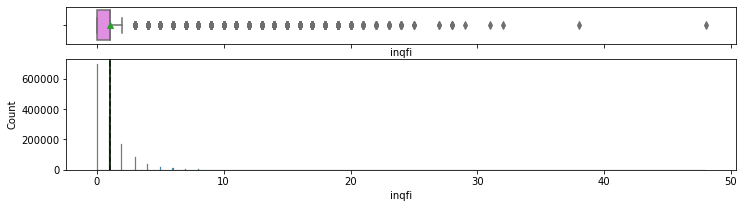

In [79]:
histogram_boxplot(df, cols_flt.columns[16])

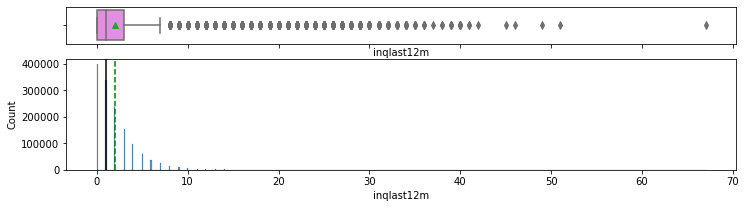

In [80]:
histogram_boxplot(df, cols_flt.columns[17])

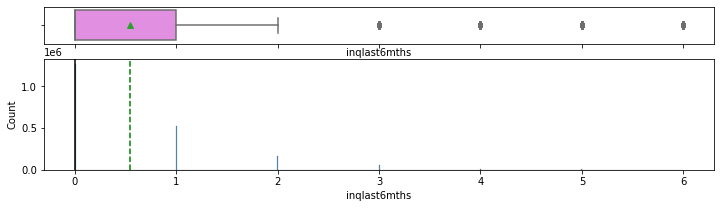

In [81]:
histogram_boxplot(df, cols_flt.columns[18])

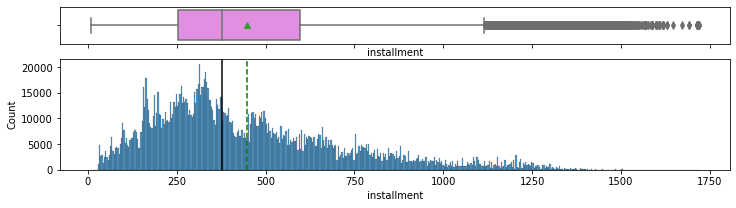

In [82]:
histogram_boxplot(df, cols_flt.columns[19])

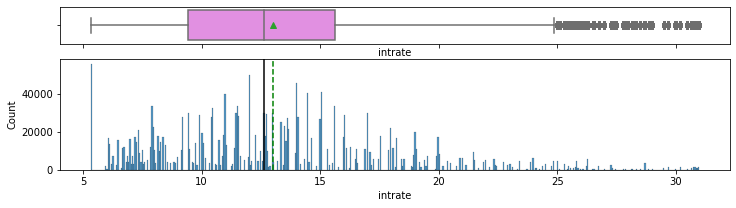

In [83]:
histogram_boxplot(df, cols_flt.columns[20])

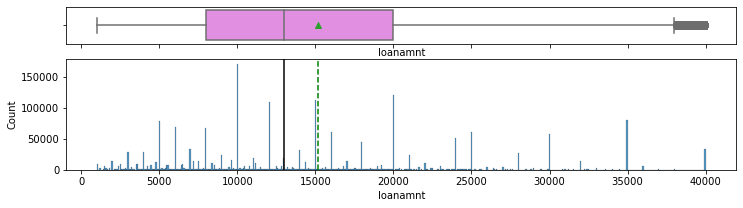

In [84]:
histogram_boxplot(df, cols_flt.columns[21])

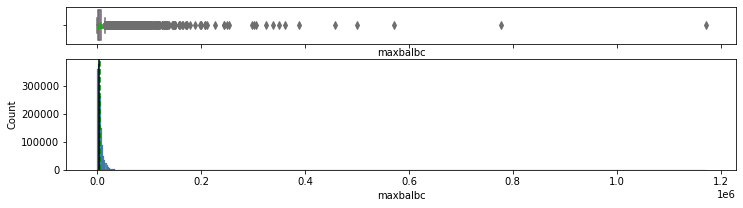

In [85]:
histogram_boxplot(df, cols_flt.columns[22])

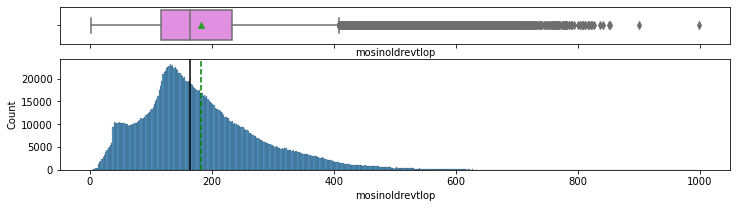

In [86]:
histogram_boxplot(df, cols_flt.columns[23])

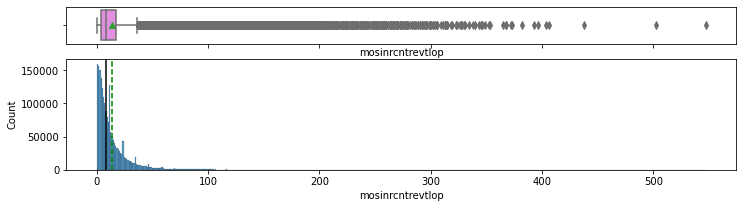

In [87]:
histogram_boxplot(df, cols_flt.columns[24])

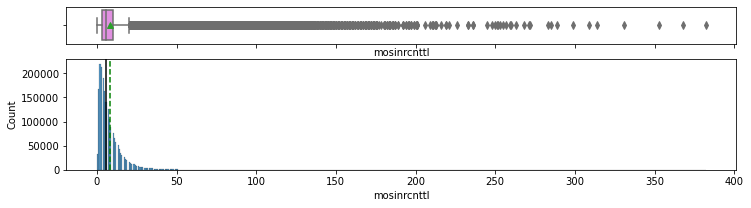

In [88]:
histogram_boxplot(df, cols_flt.columns[25])

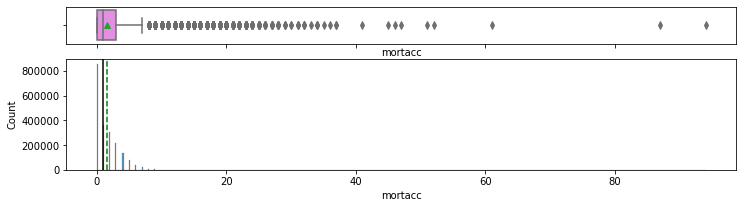

In [89]:
histogram_boxplot(df, cols_flt.columns[26])

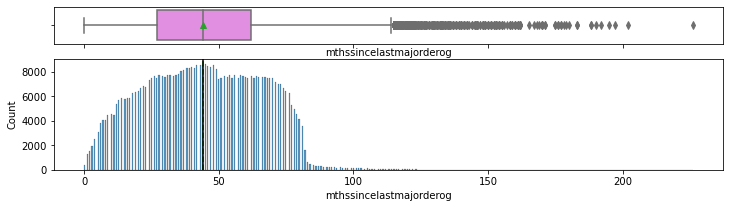

In [90]:
histogram_boxplot(df, cols_flt.columns[27])

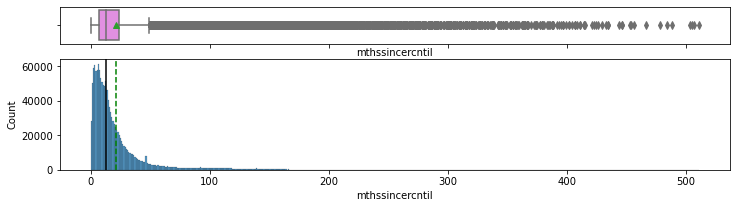

In [91]:
histogram_boxplot(df, cols_flt.columns[28])

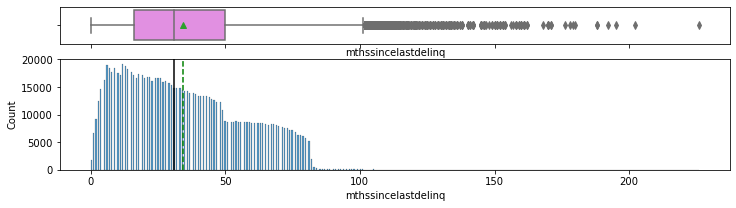

In [92]:
histogram_boxplot(df, cols_flt.columns[29])

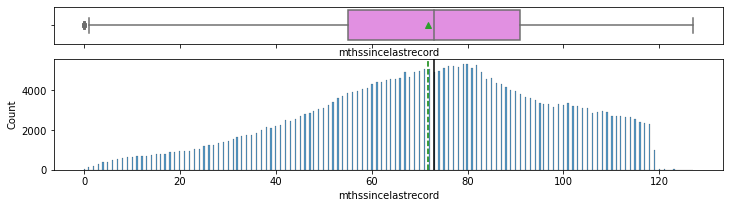

In [93]:
histogram_boxplot(df, cols_flt.columns[30])

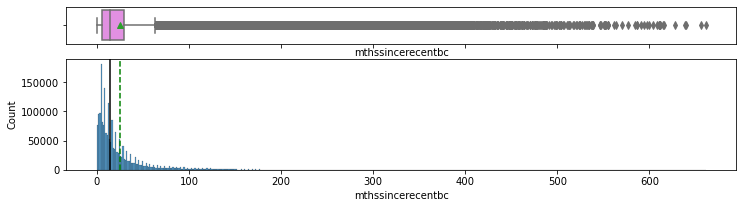

In [94]:
histogram_boxplot(df, cols_flt.columns[31])

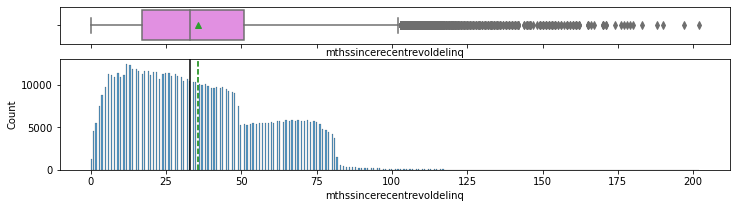

In [95]:
histogram_boxplot(df, cols_flt.columns[32])

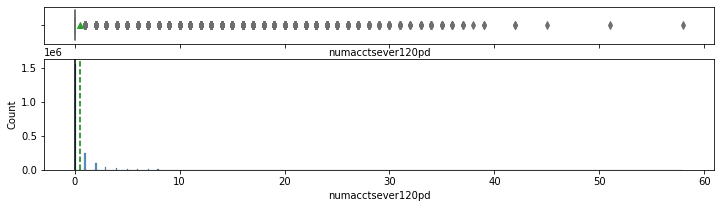

In [96]:
histogram_boxplot(df, cols_flt.columns[33])

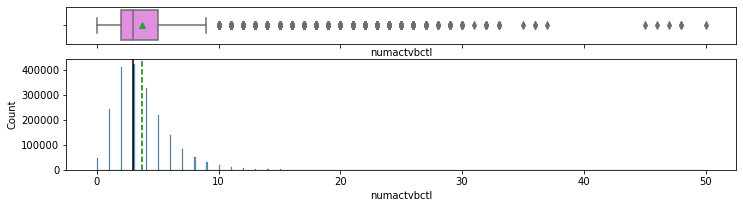

In [97]:
histogram_boxplot(df, cols_flt.columns[34])

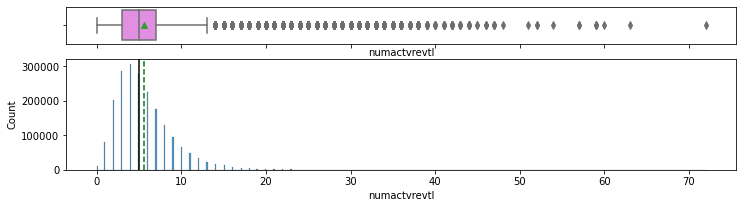

In [98]:
histogram_boxplot(df, cols_flt.columns[35])

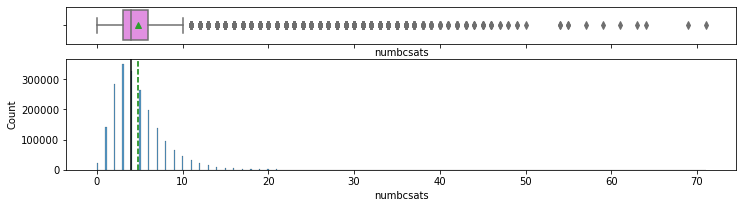

In [99]:
histogram_boxplot(df, cols_flt.columns[36])

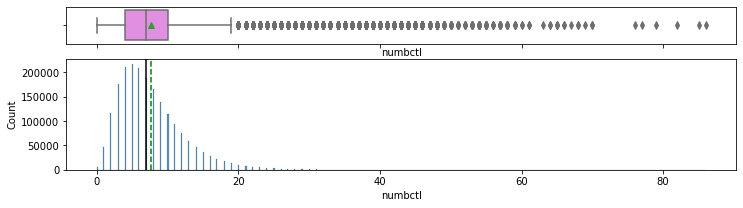

In [100]:
histogram_boxplot(df, cols_flt.columns[37])

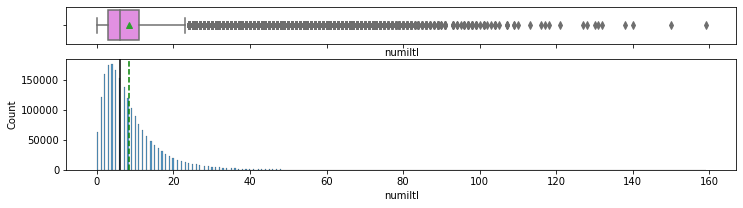

In [101]:
histogram_boxplot(df, cols_flt.columns[38])

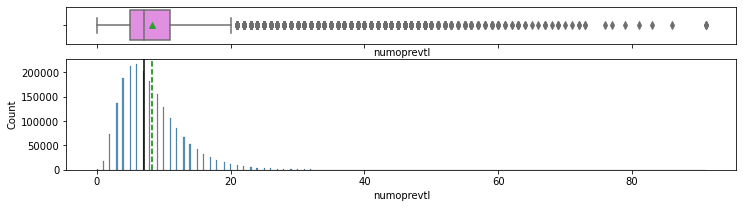

In [102]:
histogram_boxplot(df, cols_flt.columns[39])

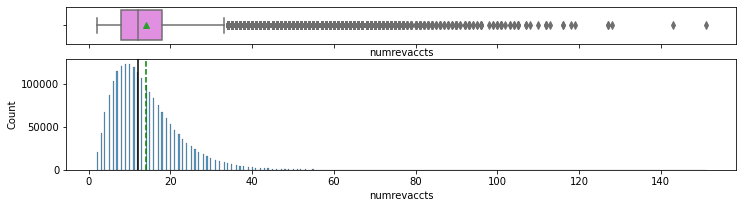

In [103]:
histogram_boxplot(df, cols_flt.columns[40])

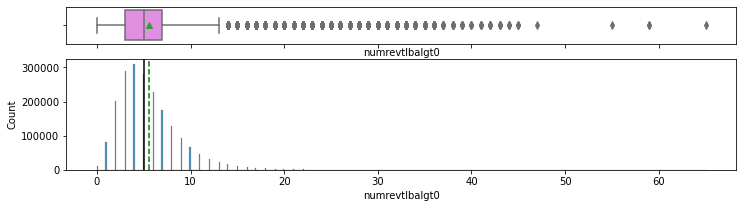

In [104]:
histogram_boxplot(df, cols_flt.columns[41])

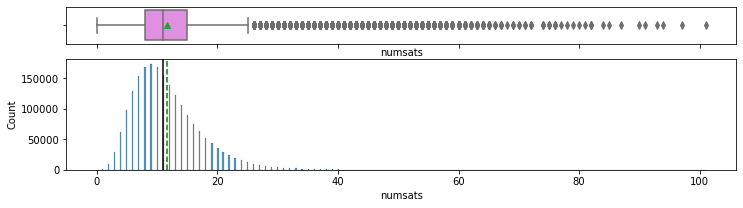

In [105]:
histogram_boxplot(df, cols_flt.columns[42])

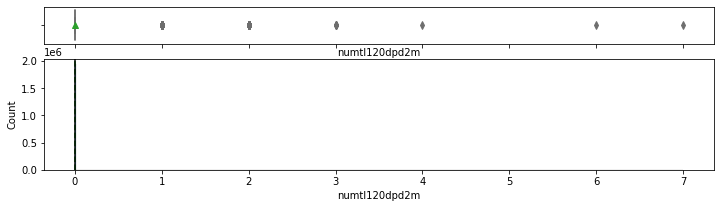

In [106]:
histogram_boxplot(df, cols_flt.columns[43])

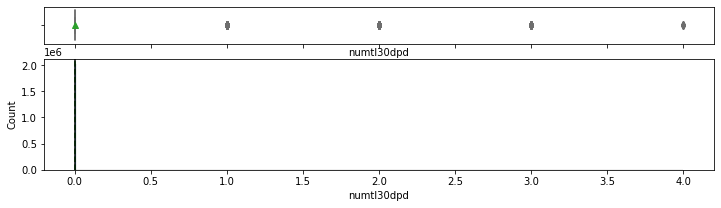

In [107]:
histogram_boxplot(df, cols_flt.columns[44])

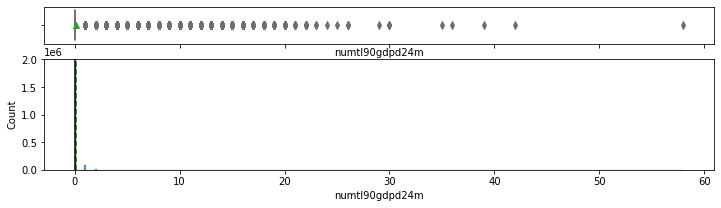

In [108]:
histogram_boxplot(df, cols_flt.columns[45])

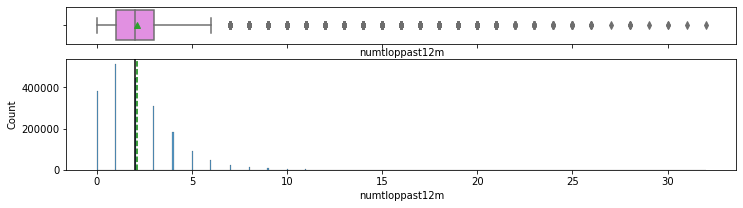

In [109]:
histogram_boxplot(df, cols_flt.columns[46])

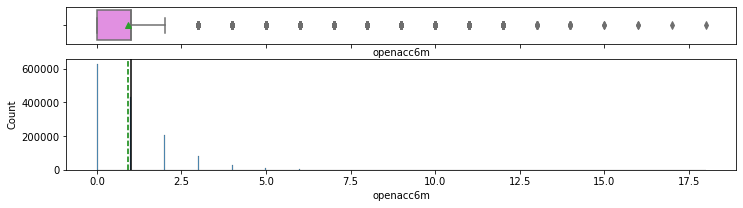

In [110]:
histogram_boxplot(df, cols_flt.columns[47])

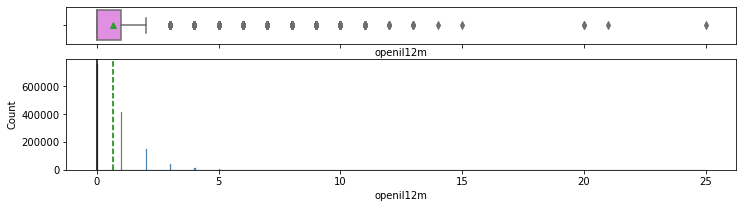

In [111]:
histogram_boxplot(df, cols_flt.columns[48])

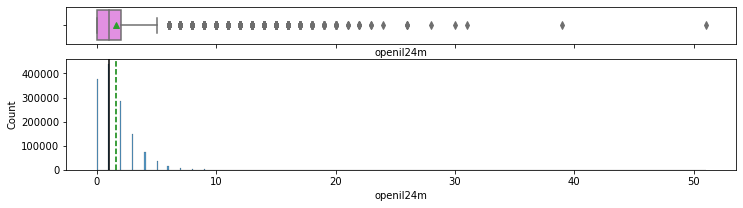

In [112]:
histogram_boxplot(df, cols_flt.columns[49])

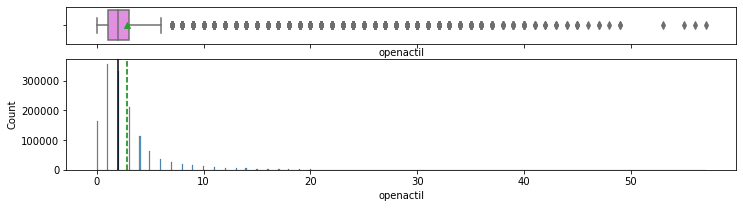

In [113]:
histogram_boxplot(df, cols_flt.columns[50])

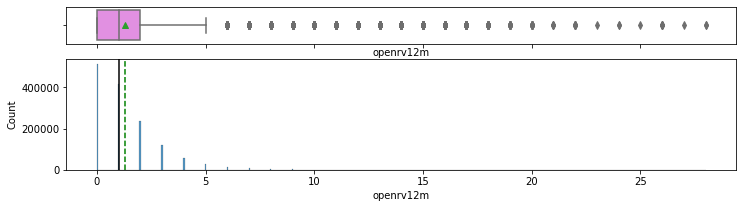

In [114]:
histogram_boxplot(df, cols_flt.columns[51])

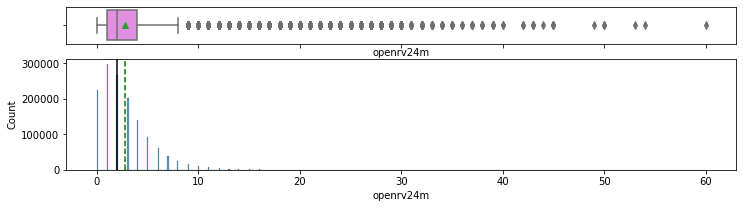

In [115]:
histogram_boxplot(df, cols_flt.columns[52])

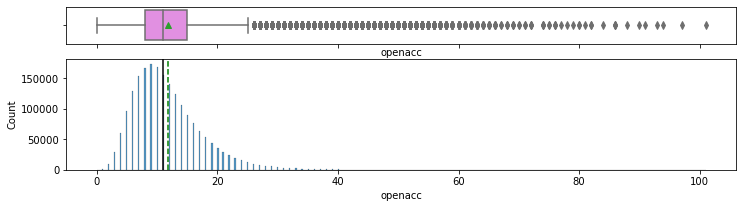

In [116]:
histogram_boxplot(df, cols_flt.columns[53])

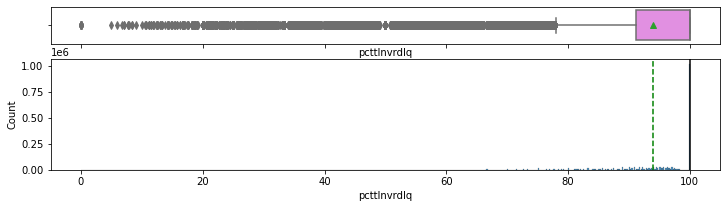

In [117]:
histogram_boxplot(df, cols_flt.columns[54])

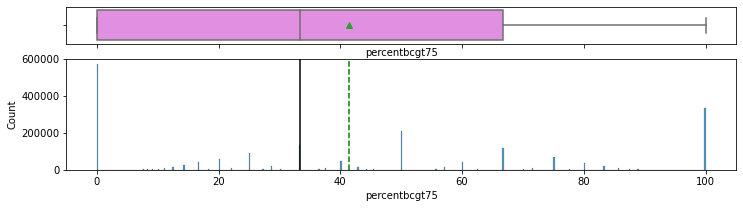

In [118]:
histogram_boxplot(df, cols_flt.columns[55])

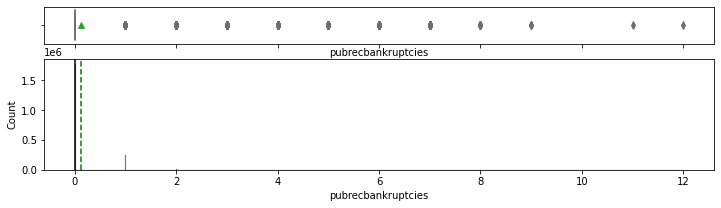

In [119]:
histogram_boxplot(df, cols_flt.columns[56])

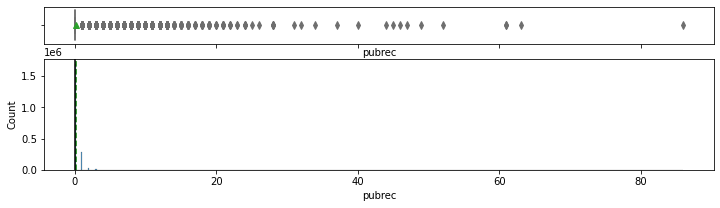

In [120]:
histogram_boxplot(df, cols_flt.columns[57])

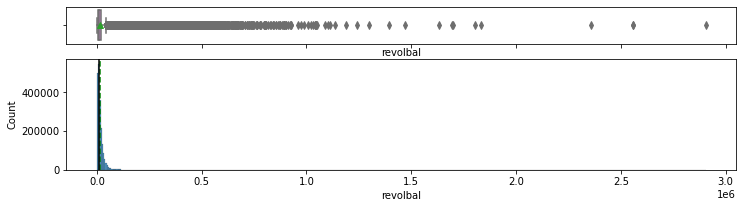

In [121]:
histogram_boxplot(df, cols_flt.columns[58])

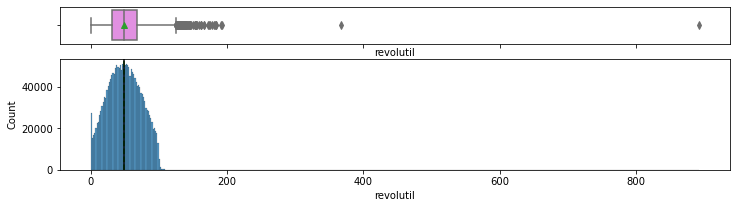

In [122]:
histogram_boxplot(df, cols_flt.columns[59])

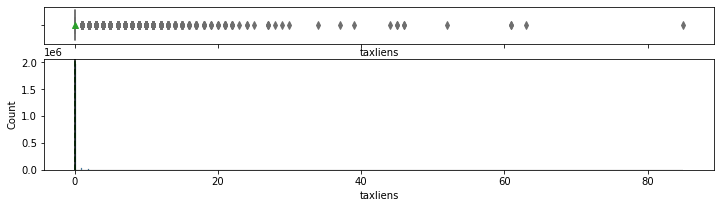

In [123]:
histogram_boxplot(df, cols_flt.columns[60])

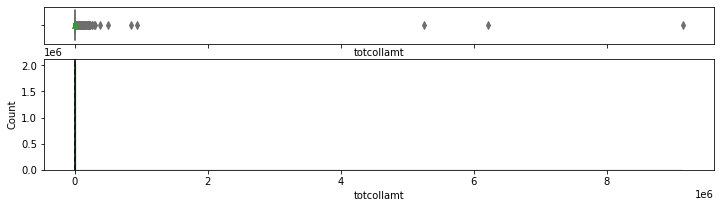

In [124]:
histogram_boxplot(df, cols_flt.columns[61])

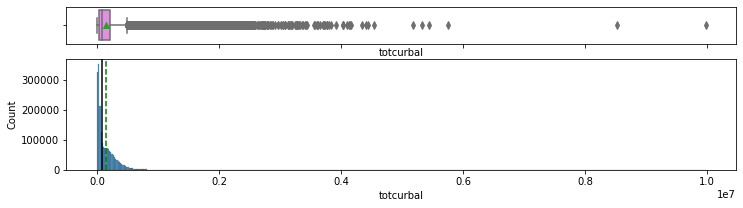

In [125]:
histogram_boxplot(df, cols_flt.columns[62])

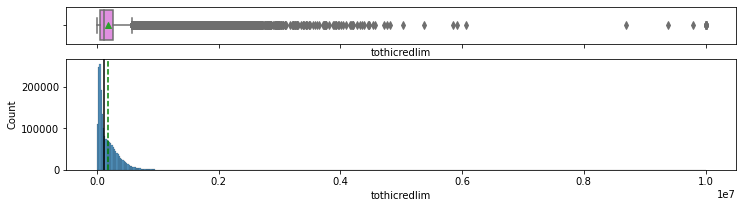

In [126]:
histogram_boxplot(df, cols_flt.columns[63])

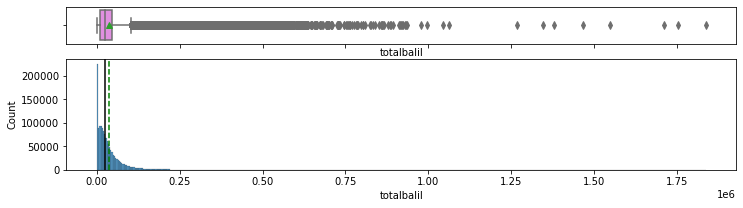

In [127]:
histogram_boxplot(df, cols_flt.columns[64])

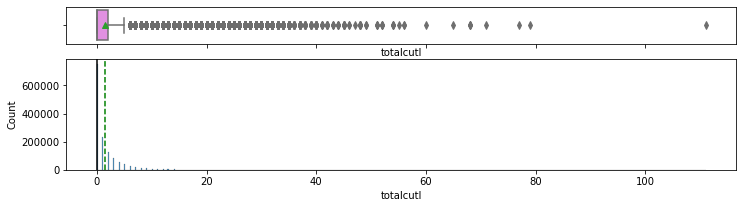

In [128]:
histogram_boxplot(df, cols_flt.columns[65])

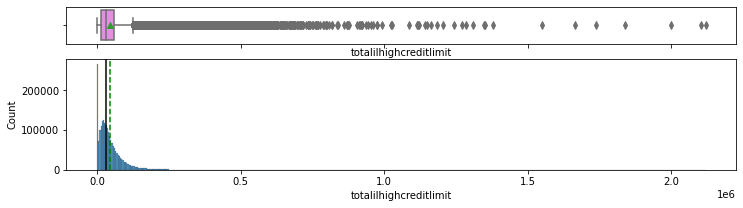

In [129]:
histogram_boxplot(df, cols_flt.columns[66])

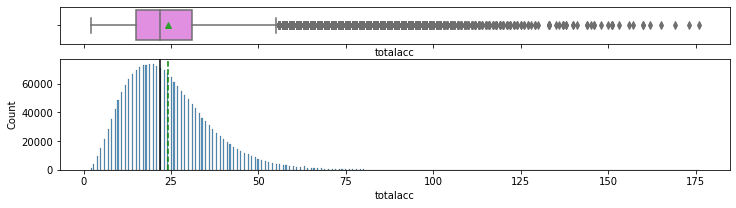

In [130]:
histogram_boxplot(df, cols_flt.columns[67])

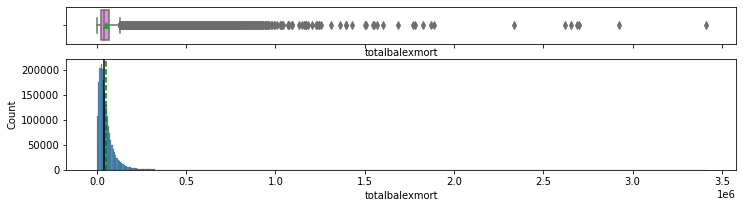

In [131]:
histogram_boxplot(df, cols_flt.columns[68])

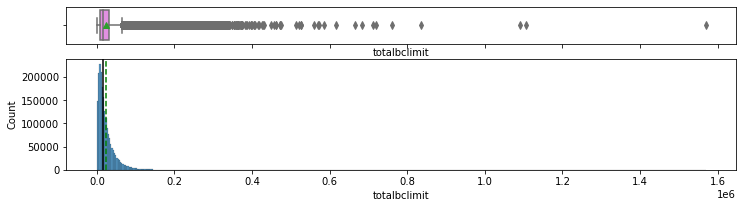

In [132]:
histogram_boxplot(df, cols_flt.columns[69])

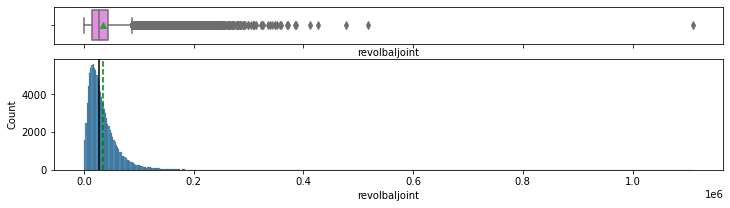

In [133]:
histogram_boxplot(df, cols_flt.columns[70])

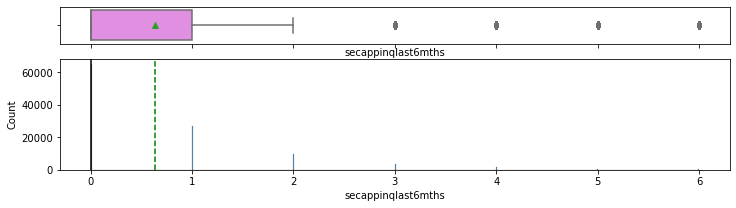

In [134]:
histogram_boxplot(df, cols_flt.columns[71])

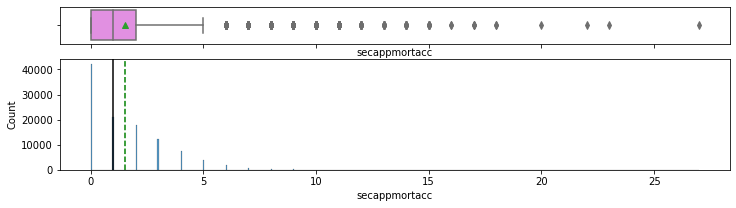

In [135]:
histogram_boxplot(df, cols_flt.columns[72])

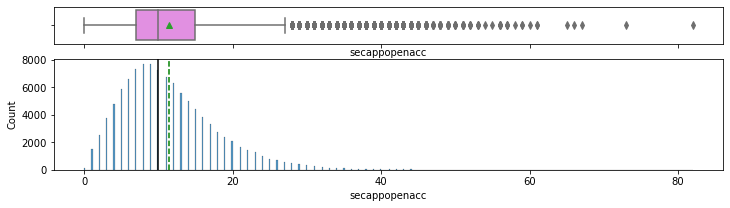

In [136]:
histogram_boxplot(df, cols_flt.columns[73])

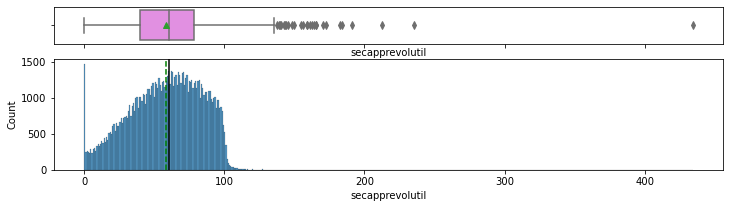

In [137]:
histogram_boxplot(df, cols_flt.columns[74])

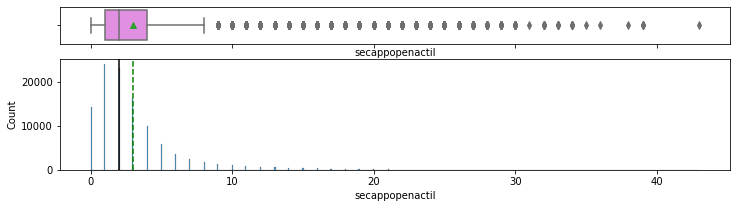

In [138]:
histogram_boxplot(df, cols_flt.columns[75])

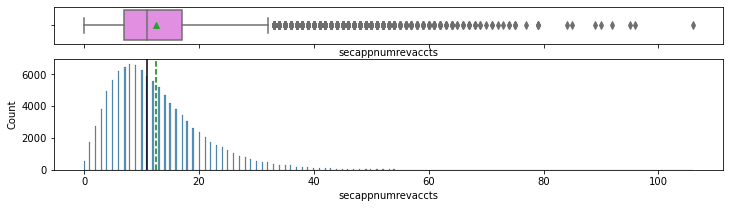

In [139]:
histogram_boxplot(df, cols_flt.columns[76])

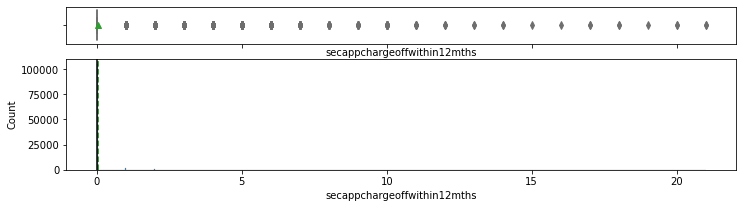

In [140]:
histogram_boxplot(df, cols_flt.columns[77])

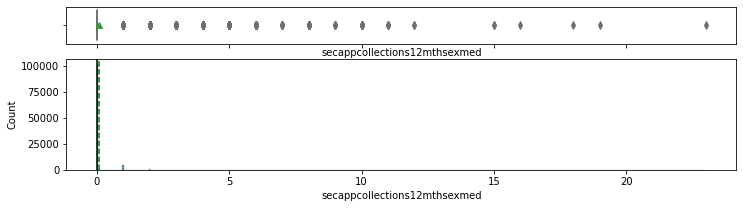

In [141]:
histogram_boxplot(df, cols_flt.columns[78])

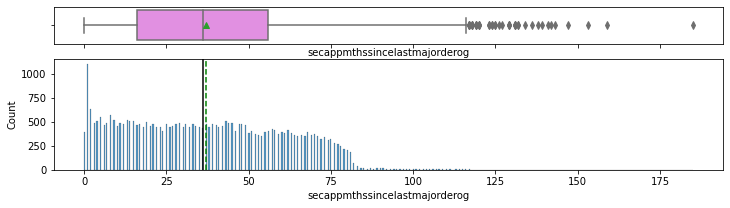

In [142]:
histogram_boxplot(df, cols_flt.columns[79])

### Bivariate Analysis

In [143]:
plt.figure(figsize=(200, 100))
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

#### Dropping correlated features based on univariate analysis

accnowdelinq is strongly correlated with numtl30dpd(0.8). Drop numtl30dpd as accnowdeling is important & we have numtl120dpd.
accopenpast24mnths is strongly correlated with openrv24m(0.85), numtloppast12m (0.77). We can drop the two.
allutil is correlated with revolutil (0.67) and bcutil (0.61). correlation is not very strong
installment, loanamnt and fundedamnt are all correlated. we can keep fundedamnt and remove the others.

#### Similar to above, we can apply this criteria to all the rest as if the correlation is above 0.8, we drop the features.

In [144]:
corr_matrix = df.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.8
to_drop = [column for column in upper.columns if any(upper[column] >= 0.8)]

# # Drop features 
# df.drop(to_drop, axis=1, inplace=True)

In [145]:
df[to_drop].info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2029952 entries, 0 to 2260698
Data columns (total 19 columns):
 #   Column                      Non-Null Count    Dtype  
---  ------                      --------------    -----  
 0   installment                 2029952 non-null  float64
 1   loanamnt                    2029952 non-null  float64
 2   mthssincerecentrevoldelinq  685912 non-null   float64
 3   numactvrevtl                2029952 non-null  float64
 4   numbcsats                   2029952 non-null  float64
 5   numrevaccts                 2029951 non-null  float64
 6   numrevtlbalgt0              2029952 non-null  float64
 7   numsats                     2029952 non-null  float64
 8   numtl30dpd                  2029952 non-null  float64
 9   openrv12m                   1394539 non-null  float64
 10  openrv24m                   1394539 non-null  float64
 11  openacc                     2029952 non-null  float64
 12  percentbcgt75               2006136 non-null  float64
 1

### DROP THE STRONGLY CORRELATED FEATURES

In [146]:
# avgcurbal can be dropped instead of totcurbal because totcurbal has stronger
# correlation with avgcurbal and tothicredlim
to_drop.append('avgcurbal')
to_drop.remove('totcurbal')

In [147]:
df.drop(to_drop, axis=1, inplace=True)

In [148]:
df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2029952 entries, 0 to 2260698
Data columns (total 75 columns):
 #   Column                         Non-Null Count    Dtype   
---  ------                         --------------    -----   
 0   accnowdelinq                   2029952 non-null  float64 
 1   accopenpast24mths              2029952 non-null  float64 
 2   allutil                        1394320 non-null  float64 
 3   annualincjoint                 120710 non-null   float64 
 4   annualinc                      2029952 non-null  float64 
 5   applicationtype                2029952 non-null  category
 6   bcopentobuy                    2006577 non-null  float64 
 7   bcutil                         2005528 non-null  float64 
 8   chargeoffwithin12mths          2029952 non-null  float64 
 9   collections12mthsexmed         2029952 non-null  float64 
 10  delinq2yrs                     2029952 non-null  float64 
 11  delinqamnt                     2029952 non-null  float64 
 12  

In [149]:
# Removing more columns
df.drop(['accopenpast24mths','allutil','bcutil','chargeoffwithin12mths','earliestcrline',
         'initialliststatus','inqfi','inqlast12m','intrate','mosinoldrevtlop','mosinrcntrevtlop',
         'mosinrcnttl','mthssincercntil','mthssincerecentbc','numbctl',
         'numiltl','numtl120dpd2m','numtl90gdpd24m','numtloppast12m','openil12m','openil24m',
         'openacc6m','openil12m','openil24m','openactil','pcttlnvrdlq','taxliens','totcollamt',
         'totcurbal','totalbalil','totalcutl','totalacc',
         'verifiedstatusjoint','revolbaljoint','secappearliestcrline','secappinqlast6mths',
         'secappmortacc','secappopenacc','secapprevolutil','secappopenactil','secappnumrevaccts',
         'secappchargeoffwithin12mths','secappmthssincelastmajorderog','disbursementmethod','zipcode_val',
         'secappcollections12mthsexmed','ilutil'], axis=1, inplace=True)

In [150]:
df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2029952 entries, 0 to 2260698
Data columns (total 30 columns):
 #   Column                   Non-Null Count    Dtype   
---  ------                   --------------    -----   
 0   accnowdelinq             2029952 non-null  float64 
 1   annualincjoint           120710 non-null   float64 
 2   annualinc                2029952 non-null  float64 
 3   applicationtype          2029952 non-null  category
 4   bcopentobuy              2006577 non-null  float64 
 5   collections12mthsexmed   2029952 non-null  float64 
 6   delinq2yrs               2029952 non-null  float64 
 7   delinqamnt               2029952 non-null  float64 
 8   dti                      2028241 non-null  float64 
 9   dtijoint                 120706 non-null   float64 
 10  emplength                1892044 non-null  category
 11  fundedamnt               2029952 non-null  float64 
 12  homeownership            2029952 non-null  category
 13  inqlast6mths             20

In [151]:
# Both the primary and the secondary borrowers have the obligation to pay the debt and both get sent to collection if loan is shifted off
# Therefore we can combine their dti and dti_joint
df.dti_combine = df.dti[df.dtijoint.isnull()].fillna(0) + df.dtijoint[df.dtijoint.isnull()].fillna(0)

In [152]:
# Both the individual income and joint income columns can be combined
df.annualinc_combine = df.annualinc[df.annualincjoint.isnull()].fillna(0) + df.annualincjoint[df.annualincjoint.isnull()].fillna(0)

In [153]:
# annualinc can be dropped as annualincjoint provides joint income of the co-borrowers
df.drop(['dti','dtijoint','annualinc','annualincjoint'], axis=1, inplace=True)

In [154]:
df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2029952 entries, 0 to 2260698
Data columns (total 26 columns):
 #   Column                   Non-Null Count    Dtype   
---  ------                   --------------    -----   
 0   accnowdelinq             2029952 non-null  float64 
 1   applicationtype          2029952 non-null  category
 2   bcopentobuy              2006577 non-null  float64 
 3   collections12mthsexmed   2029952 non-null  float64 
 4   delinq2yrs               2029952 non-null  float64 
 5   delinqamnt               2029952 non-null  float64 
 6   emplength                1892044 non-null  category
 7   fundedamnt               2029952 non-null  float64 
 8   homeownership            2029952 non-null  category
 9   inqlast6mths             2029951 non-null  float64 
 10  maxbalbc                 1394539 non-null  float64 
 11  mortacc                  2029952 non-null  float64 
 12  mthssincelastmajorderog  548259 non-null   float64 
 13  mthssincelastdelinq      10

In [228]:
df2 =df.copy()

In [229]:
plt.figure(figsize=(200, 100))
sns.set(font_scale=14)
sns.heatmap(df2.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

In [230]:
# numrevaccts and numoprevtl are both 0.8 correlated. we can use numrevaccts as it has less correlation with other features.
df2.drop('numoprevtl', axis=1, inplace=True)

In [231]:
df2.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2029952 entries, 0 to 2260698
Data columns (total 25 columns):
 #   Column                   Non-Null Count    Dtype   
---  ------                   --------------    -----   
 0   accnowdelinq             2029952 non-null  float64 
 1   applicationtype          2029952 non-null  category
 2   bcopentobuy              2006577 non-null  float64 
 3   collections12mthsexmed   2029952 non-null  float64 
 4   delinq2yrs               2029952 non-null  float64 
 5   delinqamnt               2029952 non-null  float64 
 6   emplength                1892044 non-null  category
 7   fundedamnt               2029952 non-null  float64 
 8   homeownership            2029952 non-null  category
 9   inqlast6mths             2029951 non-null  float64 
 10  maxbalbc                 1394539 non-null  float64 
 11  mortacc                  2029952 non-null  float64 
 12  mthssincelastmajorderog  548259 non-null   float64 
 13  mthssincelastdelinq      10

#### The correlation matrix looks good. Let's take a close look at few categorical features

## Categorical features

In [232]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [233]:
sns.set(font_scale=1)

In [234]:
df2.describe(include='category')

,applicationtype,emplength,homeownership,purpose,term,grade
count,2029952,1892044,2029952,2029952,2029952,2029952
unique,2,11,4,14,2,7
top,Individual,10+ years,MORTGAGE,debt_consolidation,36 months,C
freq,1909242,677437,995479,1146650,1434328,591304


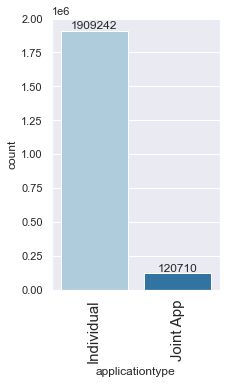

In [235]:
labeled_barplot(df2, df2.columns[1])

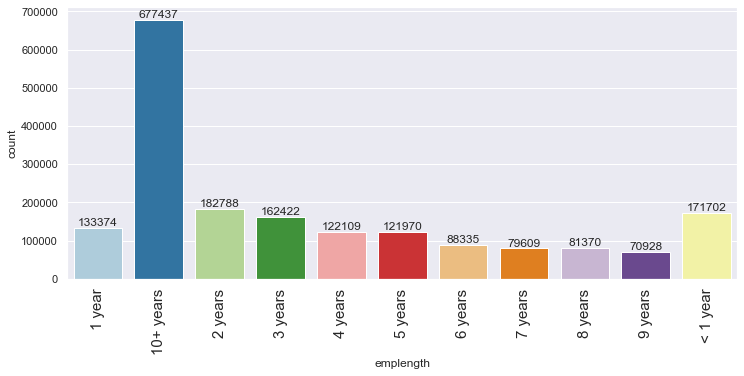

In [236]:
labeled_barplot(df2, df2.columns[6])

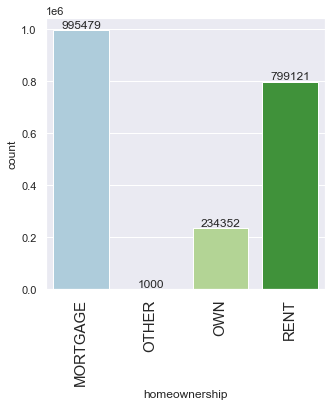

In [237]:
labeled_barplot(df2, df2.columns[8])

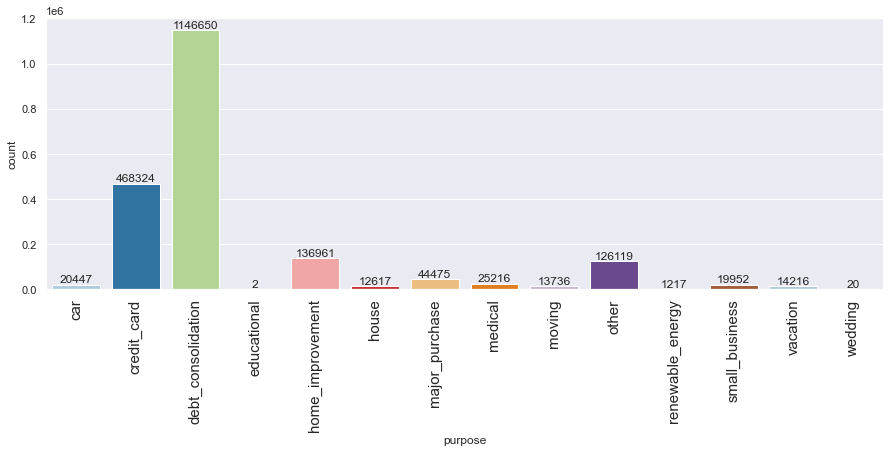

In [238]:
labeled_barplot(df2, df2.columns[19])

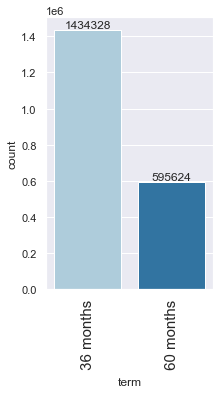

In [210]:
labeled_barplot(df2, df2.columns[22])

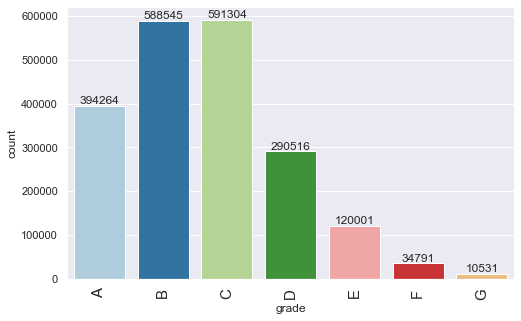

In [240]:
labeled_barplot(df2, df2.columns[24])

### IMPUTATION

* We will use manual approach to impute the values as many of the columns require manual way to check the missing values
* In case there are still missing values, we will use KNN imputer to impute missing values.
* `KNNImputer`: Each sample's missing values are imputed by looking at the n_neighbors nearest neighbors found in the training set. Default value for n_neighbors=5.
* KNN imputer replaces missing values using the average of k nearest non-missing feature values.
* Nearest points are found based on euclidean distance.


**The values obtained might not be integer always which is not be the best way to impute categorical values**
- To take care of that we will round off the obtained values to nearest integer value

In [343]:
df3 = df2.copy()

In [344]:
df3.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2029952 entries, 0 to 2260698
Data columns (total 25 columns):
 #   Column                   Non-Null Count    Dtype   
---  ------                   --------------    -----   
 0   accnowdelinq             2029952 non-null  float64 
 1   applicationtype          2029952 non-null  category
 2   bcopentobuy              2006577 non-null  float64 
 3   collections12mthsexmed   2029952 non-null  float64 
 4   delinq2yrs               2029952 non-null  float64 
 5   delinqamnt               2029952 non-null  float64 
 6   emplength                1892044 non-null  category
 7   fundedamnt               2029952 non-null  float64 
 8   homeownership            2029952 non-null  category
 9   inqlast6mths             2029951 non-null  float64 
 10  maxbalbc                 1394539 non-null  float64 
 11  mortacc                  2029952 non-null  float64 
 12  mthssincelastmajorderog  548259 non-null   float64 
 13  mthssincelastdelinq      10

In [345]:
# bcopentobuy null values can be when customer doesnot hold it. so it would be zero
df3.bcopentobuy=df3.bcopentobuy.fillna(0)

In [346]:
# emplength nan means 0 or less than one year experience
df3.emplength=df3.emplength.fillna('< 1 year')

In [347]:
# maxbalbc is the maximum balance owed on all revolving accounts (nan means 0)
df3.maxbalbc=df3.maxbalbc.fillna(0)

In [348]:
# mortacc is nan means there is never any mortgage account (means 0)
df3.mortacc=df3.mortacc.fillna(0)

In [349]:
# mthssincelastmajorderog is nan probably because there is no worse rating
df3.mthssincelastmajorderog = df3.mthssincelastmajorderog.fillna(0)

In [350]:
# mthssincelastdelinq is nan probably because there is never any delinquency
df3.mthssincelastdelinq = df3.mthssincelastdelinq.fillna(0)

In [351]:
# mthssincelastrecord is nan because there is never any public record
df3.mthssincelastrecord  = df3.mthssincelastrecord.fillna(0)

In [352]:
# secappficorange is nan because the secondary applicant doesn't exist. So we can write 0 here.
df3.secappficorange=df3.secappficorange.fillna(0)

In [353]:
df3.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2029952 entries, 0 to 2260698
Data columns (total 25 columns):
 #   Column                   Non-Null Count    Dtype   
---  ------                   --------------    -----   
 0   accnowdelinq             2029952 non-null  float64 
 1   applicationtype          2029952 non-null  category
 2   bcopentobuy              2029952 non-null  float64 
 3   collections12mthsexmed   2029952 non-null  float64 
 4   delinq2yrs               2029952 non-null  float64 
 5   delinqamnt               2029952 non-null  float64 
 6   emplength                2029952 non-null  category
 7   fundedamnt               2029952 non-null  float64 
 8   homeownership            2029952 non-null  category
 9   inqlast6mths             2029951 non-null  float64 
 10  maxbalbc                 2029952 non-null  float64 
 11  mortacc                  2029952 non-null  float64 
 12  mthssincelastmajorderog  2029952 non-null  float64 
 13  mthssincelastdelinq      20

In [354]:
# df3.to_csv('data_25features', sep='\t', encoding='utf-8')

### Scaling the data

In [355]:
applicationtype = {df3.applicationtype.unique().dropna()[0]: 0,
                   df3.applicationtype.unique().dropna()[1]: 1}
df3["applicationtype"] = df3["applicationtype"].map(applicationtype)

In [356]:
purpose = {df3.purpose.unique().dropna()[0]: 0,df3.purpose.unique().dropna()[1]: 1,
          df3.purpose.unique().dropna()[2]: 2,df3.purpose.unique().dropna()[3]: 3,
          df3.purpose.unique().dropna()[4]: 4,df3.purpose.unique().dropna()[5]: 5,
          df3.purpose.unique().dropna()[6]: 6,df3.purpose.unique().dropna()[7]: 7,
          df3.purpose.unique().dropna()[8]: 8,df3.purpose.unique().dropna()[9]: 9,
          df3.purpose.unique().dropna()[10]: 10,df3.purpose.unique().dropna()[11]: 11,
          df3.purpose.unique().dropna()[12]: 12,df3.purpose.unique().dropna()[13]: 13}
df3["purpose"] = df3["purpose"].map(purpose)

In [357]:
emplength = {
    "< 1 year": 0,
    "1 year": 1,
    "2 years": 2,
    "3 years": 3,
    "4 years": 4,
    "5 years": 5,
    "6 years": 6,
    "7 years": 7,
    "8 years": 8,
    "9 years": 9,
    "10+ years": 10}
df3["emplength"] = df3["emplength"].map(emplength)

In [358]:
homeownership = {'MORTGAGE':0, 'RENT':1, 'OWN':2, 'OTHER':3}
df3.homeownership = df3.homeownership.map(homeownership)

In [359]:
term = {' 36 months':0, ' 60 months':1}
df3.term = df3.term.map(term)

In [318]:
grade = {'A':0, 'B':0, 'C':0, 'D':0, 'E':0, 'F':0, 'G':0} 
df3.grade = df3.grade.map(grade)

In [366]:
type(df3.term[0])

numpy.int64

In [362]:
df3.grade.unique()

['C', 'B', 'F', 'A', 'E', 'D', 'G']
Categories (7, object): ['C', 'B', 'F', 'A', 'E', 'D', 'G']

In [368]:
plt.figure(figsize=(200, 100))
sns.set(font_scale=14)
sns.heatmap(df2.purpose.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

In [254]:
scaler = StandardScaler()
subset = df4.copy()
subset_scaled = scaler.fit_transform(subset)

ValueError: could not convert string to float: 'Individual'

In [180]:
# jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10

In [ ]:
clusters = range(1, 9)
meanDistortions = []

for k in clusters:
    model = KMeans(n_clusters=k, random_state=1)
    model.fit(subset_scaled_df)
    prediction = model.predict(k_means_df)
    distortion = (
        sum(np.min(cdist(k_means_df, model.cluster_centers_, "euclidean"), axis=1))
        / k_means_df.shape[0]
    )

    meanDistortions.append(distortion)

    print("Number of Clusters:", k, "\tAverage Distortion:", distortion)

plt.plot(clusters, meanDistortions, "bx-")
plt.xlabel("k")
plt.ylabel("Average Distortion")
plt.title("Selecting k with the Elbow Method", fontsize=20)
plt.show()

In [194]:
# to scale the data using z-score
from sklearn.preprocessing import StandardScaler

# to compute distances
from scipy.spatial.distance import cdist, pdist

# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

### CLUSTERING K-Means

In [181]:
# from datetime import datetime as d
# 